### Домашнее задание "Визуализация данных в Python"

[Kaggle Datasets: House Prices: Advanced Regression Techniques](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data)

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from plotly.offline import init_notebook_mode, iplot
import plotly
import plotly.graph_objs as go

# Позволяет запускать интерактивную визуализацию в jn
init_notebook_mode(connected=True)

# Увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 12,9

# Отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

# Графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg'

In [2]:
# Подключаем dataset - House Prices: Advanced Regression Techniques
df = pd.read_csv('/Users/aleksandr/Downloads/train.csv')

In [ ]:
# # Смотрим содержание df (возвращаю в свернутое состояние т.к. 81 колонка)
# df.info()

# # Содержание df (строки и столбцы)
# df.shape

# # Посмотрим минимум, максимум и т.д по df
# df.describe()

# # Посмотрим типы данных
# df.get_dtype_counts()

# # Посмотрим на колонки в df 
# df.columns

In [3]:
# Выводим первые 10 строк df
# Можно заметить что в df есть пустые значения NaN
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


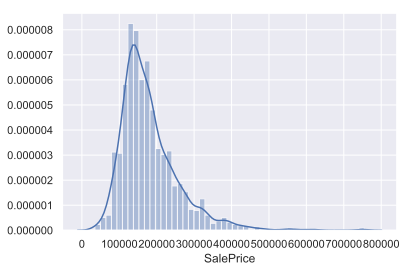

In [66]:
# Построим график плотности распределения по прайсу продаж
sns.distplot(df.SalePrice)

In [35]:
# Посмотрим минимум, максимум и т.д по df[['SalePrice']] (если брать [] то будет siries) на git не отображается .style.bar() но он есть...
bdr = df[['SalePrice']].describe()
bdr.style.bar()

,SalePrice
count,1460
mean,180921
std,79442.5
min,34900
25%,129975
50%,163000
75%,214000
max,755000


In [8]:
# Проверка переменных 0,3 и выше соотносится с независимой переменной, которая является продажной ценой

top_f = df.corr().index[abs(corrmat['SalePrice'])> 0.3]
top_f

Index(['LotFrontage', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'FullBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SalePrice'],
      dtype='object')

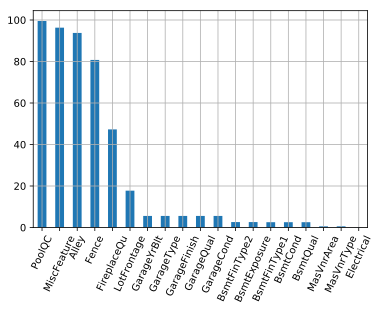

In [44]:
dynamics = round(df.isnull().sum()[df.isnull().sum()>0]/len(df) * 100, 2).sort_values(ascending=False)
dynamics.plot(kind='bar', rot=65)
plt.grid()

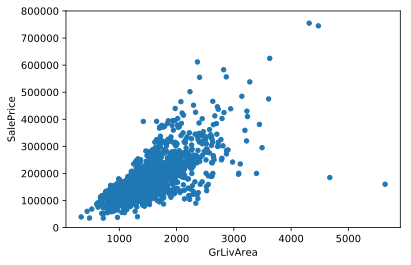

In [31]:
# Посмотрим на разброс, есть ли связь между GrLivArea и SalePrice

var = 'GrLivArea'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
df.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

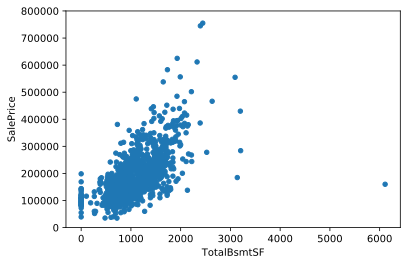

In [36]:
# Посмотрим на разброс, есть ли связь между TotalBsmtSF и SalePrice

var = 'TotalBsmtSF'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

GrLivArea, TotalBsmtSF отлично коррелируют с SalePrice

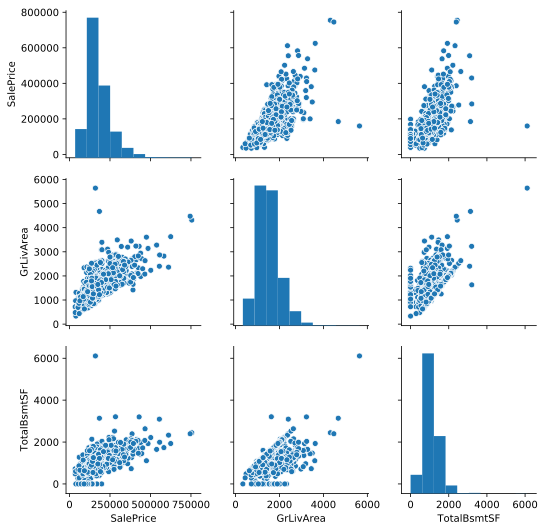

In [57]:
sns_plot = sns.pairplot(
    df[['SalePrice', 'GrLivArea', 'TotalBsmtSF']])

sns_plot

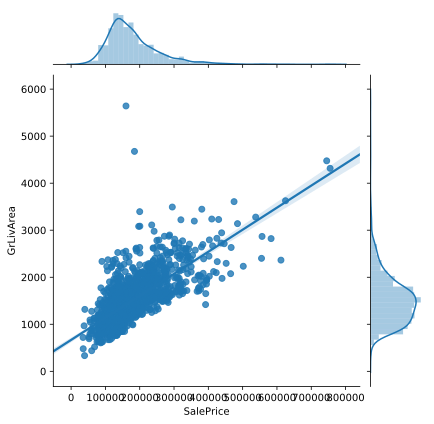

In [51]:
# Посмотрим подробнее на связь между SalePrice и GrLivArea а также SalePrice и TotalBsmtSF
# Можно заметить как было выше связь есть, но также есть выбросы спишем на NaN в данных

sns.jointplot(x='SalePrice', y='GrLivArea', 
              data=df, kind='reg')



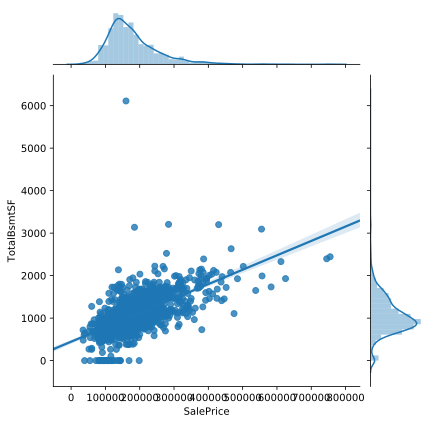

In [48]:
sns.jointplot(x='SalePrice', y='TotalBsmtSF', 
              data=df, kind='reg')

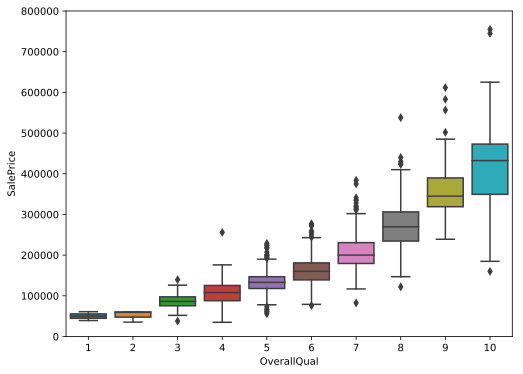

In [52]:
# Отношения с категориальными чертами / SalePrice

var = 'OverallQual'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

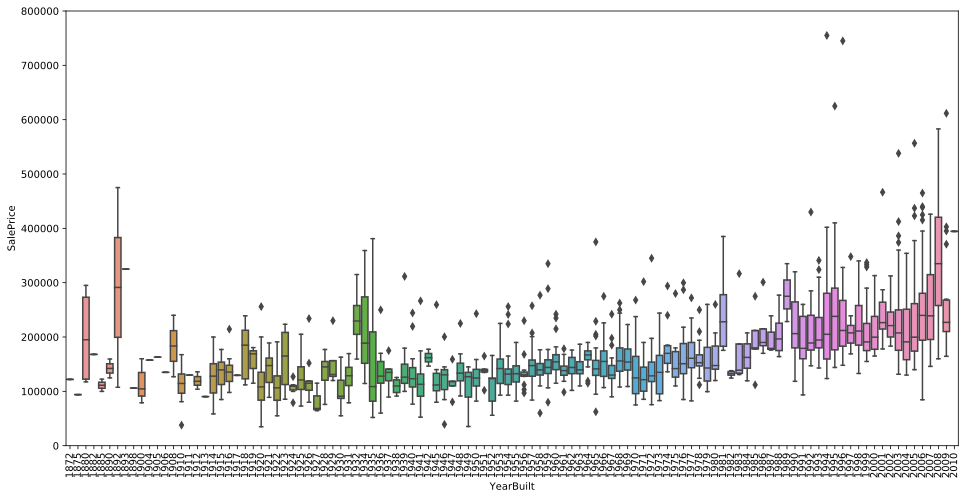

In [54]:
var = 'YearBuilt'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);
plt.xticks(rotation=90);

Резюмируем:

«GrLivArea» и «TotalBsmtSF» кажутся линейно связанными с «SalePrice». Оба отношения являются положительными, что означает, что с увеличением одной переменной увеличивается и другая. В случае TotalBsmtSF мы видим, что наклон линейных отношений особенно высок.
Похоже, что «TotalQual» и «YearBuilt» также связаны с «SalePrice». Взаимосвязь кажется более сильной в случае «TotalQual», где на рамочном графике показано, как цены продажи увеличиваются с общим качеством.

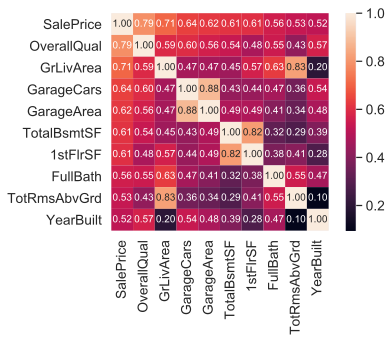

In [64]:
# корреляционная матрица по SalePrice

k = 10 # задаем количество переменных
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, 
                 yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [65]:
# диограмма рассеиввания

sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(df[cols], size = 2.5)
plt.show();

In [ ]:
pass